In [4]:
try:
    %tensorflow_version 2.x
    COLAB=True
    print("Note: using Google Colab")
except:     
    print("Note: not using Google Colab")
    COLAB=False

def hms_string(sec_elapsed):
    h=int(sec_elapsed/(60*60)) 
    m=int((sec_elapsed%(60*60))/60)
    s=sec_elapsed%60
    return f"{h}:{m:>02}:{s:>05.2f}"

Note: not using Google Colab


In [9]:
!ls "/mnt/g/My Drive/Projects/119_DeepLearningWithKerasTutorial"


/bin/bash: /home/arsi/miniconda3/lib/libtinfo.so.6: no version information available (required by /bin/bash)
data
deep_learning_03_python_intro.ipynb
deep_learning_04_collections.ipynb
deep_learning_05_file_handling.ipynb
deep_learning_06_functions_lamda_map_reduce.ipynb
deep_learning_12_pandas.ipynb
deep_learning_13_pandas_encoding_categorical.ipynb
deep_learning_14_pandas_group_sort_shuffle.ipynb
deep_learning_15_pandas_apply_map.ipynb
deep_learning_16_pandas_feature_engineering.ipynb
deep_learning_18_tensorflow_keras.ipynb
deep_learning_19_keras_saving_loading.ipynb
deep_learning_20_early_stopping.ipynb
deep_learning_21_extracting_keras_weights.ipynb
deep_learning_22_encoding_feature.ipynb
deep_learning_23_multi_class.ipynb
deep_learning_25_back_propagation_adam_momentum_sgd.ipynb
deep_learning_26_rmse_log_loss.ipynb
deep_learning_27_regularization_ridge_lasso.ipynb
deep_learning_28_kfold_cross_validation.ipynb
deep_learning_29_keras_l1_l2.ipynb
deep_learning_30_dropout.ipynb
deep_l

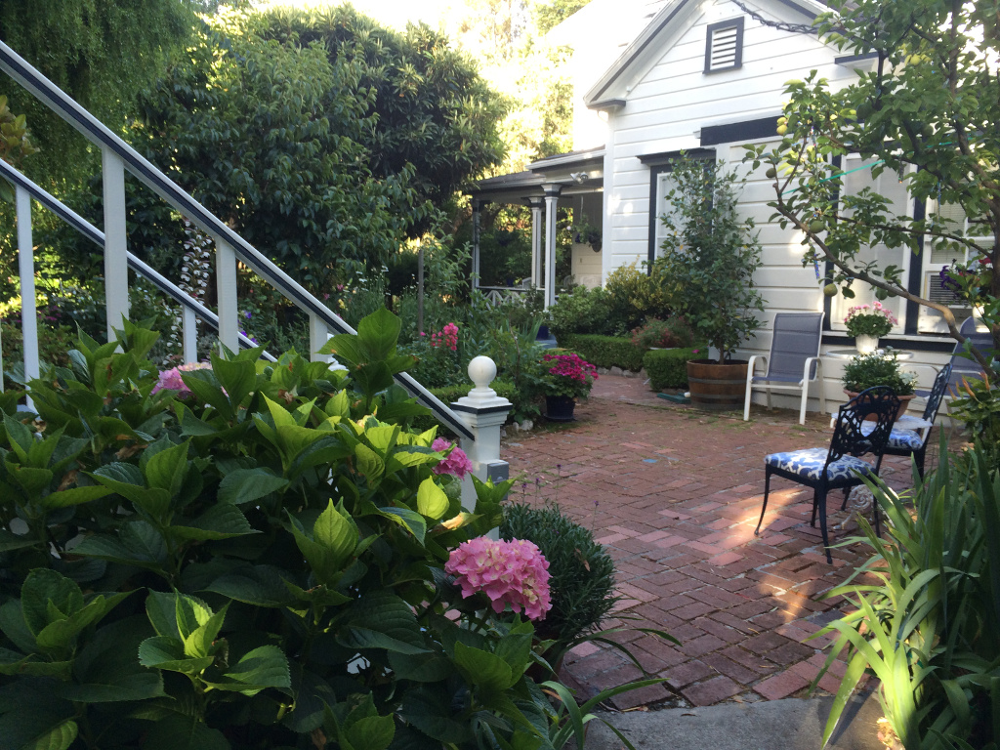

In [12]:
import urllib.request
import shutil
from IPython.display import Image
import os

URL="https://github.com/jeffheaton/t81_558_deep_learning/" +\
  "blob/master/photos/landscape.jpg?raw=true"

PATH= "/mnt/g/My Drive/Projects/119_DeepLearningWithKerasTutorial/"
LOCAL_IMG_FILE="data/temp/landscape.jpg"


with urllib.request.urlopen(URL) as response, \
    open(os.path.join(PATH,LOCAL_IMG_FILE),"wb") as out_file:
    shutil.copyfileobj(response,out_file)

Image(filename=os.path.join(PATH,LOCAL_IMG_FILE))

In [14]:
from numpy import expand_dims
from keras_preprocessing.image import load_img
from keras_preprocessing.image import img_to_array
from keras_preprocessing.image import ImageDataGenerator
from matplotlib import pyplot
import matplotlib.pyplot as plt
import numpy as np
import matplotlib

def visualize_generator(img_file,gen):
    # Load the requested image
    img=load_img(img_file)
    data = img_to_array(img)
    samples = expand_dims(data, 0)

	# Generat augumentations from the generator
    it=gen.flow(samples,batch_size=1)
    images=[]

    for i in range(4):
        batch=it.next()
        image=batch[0].astype('uint8')
        images.append(image)

    images=np.array(images)

    # Create a grid of 4 images from the generator
    index, height, width, channels = images.shape
    nrows = index//2

    grid = (images.reshape(nrows, 2, height, width, channels)
            .swapaxes(1,2)
            .reshape(height*nrows, width*2, 3))
    
    fig = plt.figure(figsize=(15., 15.))
    plt.axis('off')
    plt.imshow(grid)



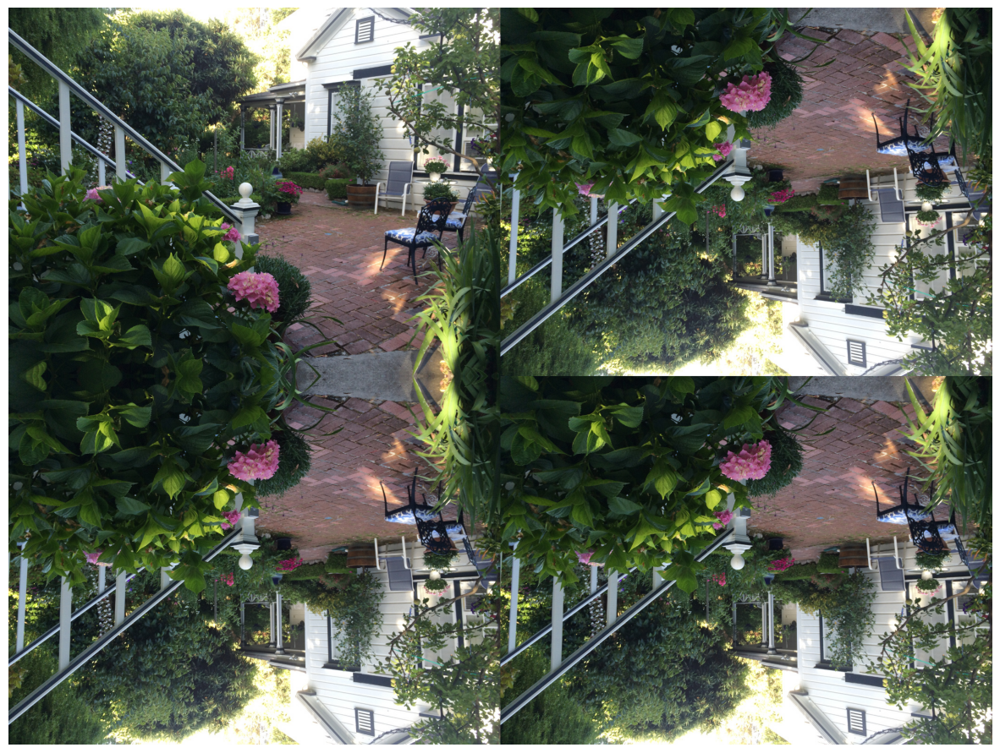

In [17]:
visualize_generator(
  os.path.join(PATH,LOCAL_IMG_FILE),
  ImageDataGenerator(horizontal_flip=True, vertical_flip=True))

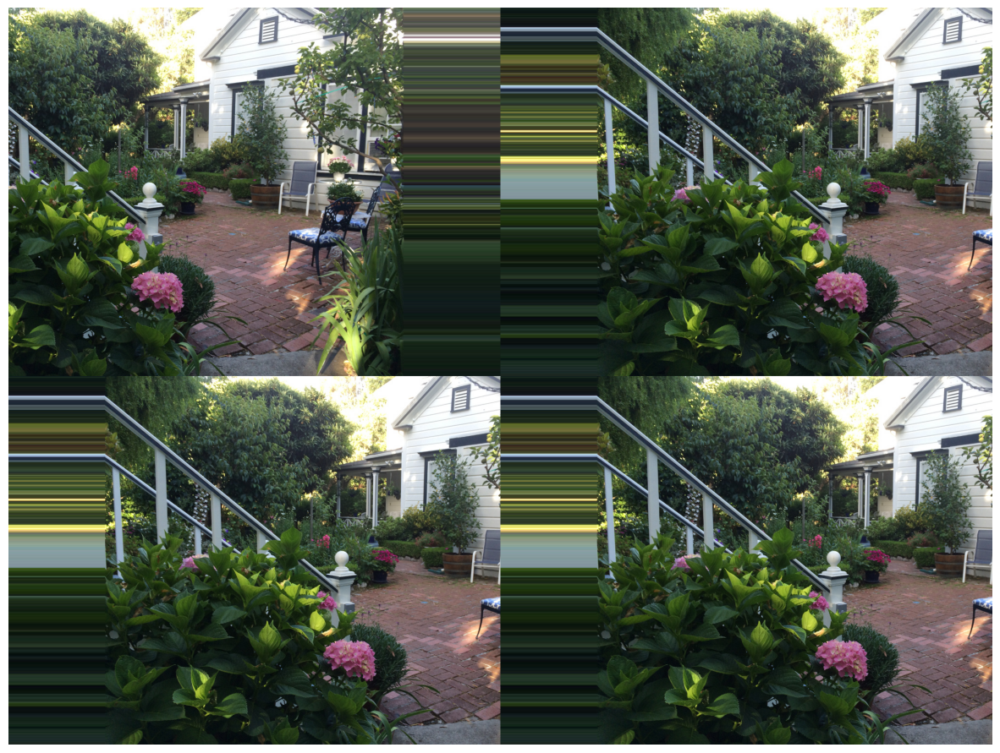

In [23]:
visualize_generator(
    os.path.join(PATH,LOCAL_IMG_FILE),
    ImageDataGenerator(width_shift_range=[-200,200], 
        fill_mode='nearest'))

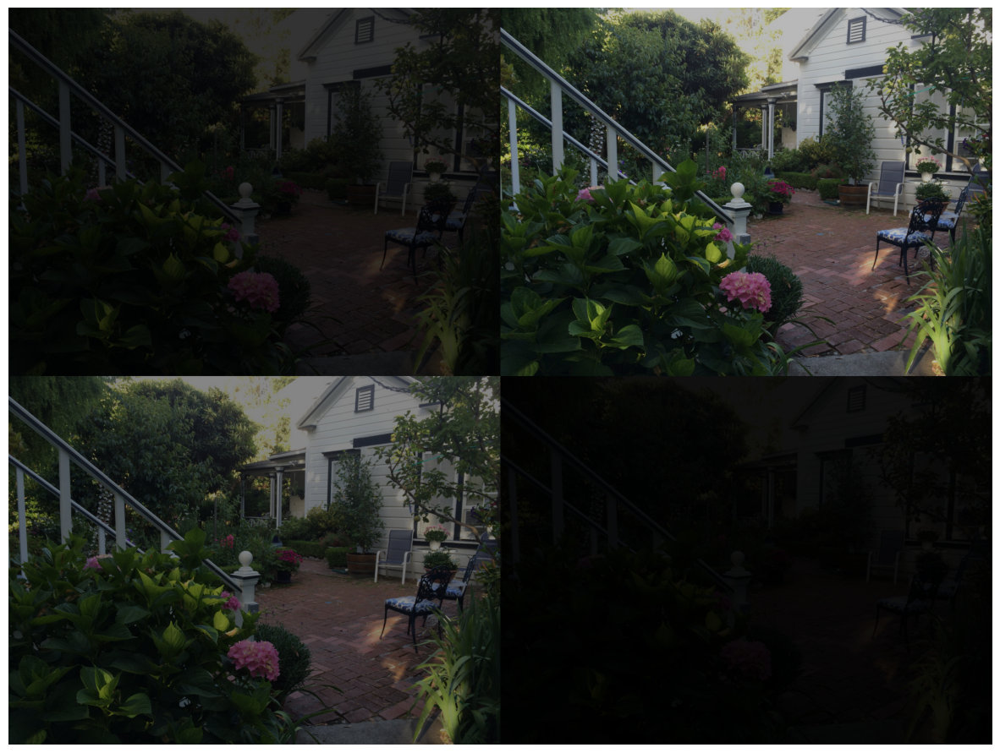

In [26]:
visualize_generator(
  os.path.join(PATH,LOCAL_IMG_FILE),
  ImageDataGenerator(brightness_range=[0,1]))

# brightness_range=None, shear_range=0.0

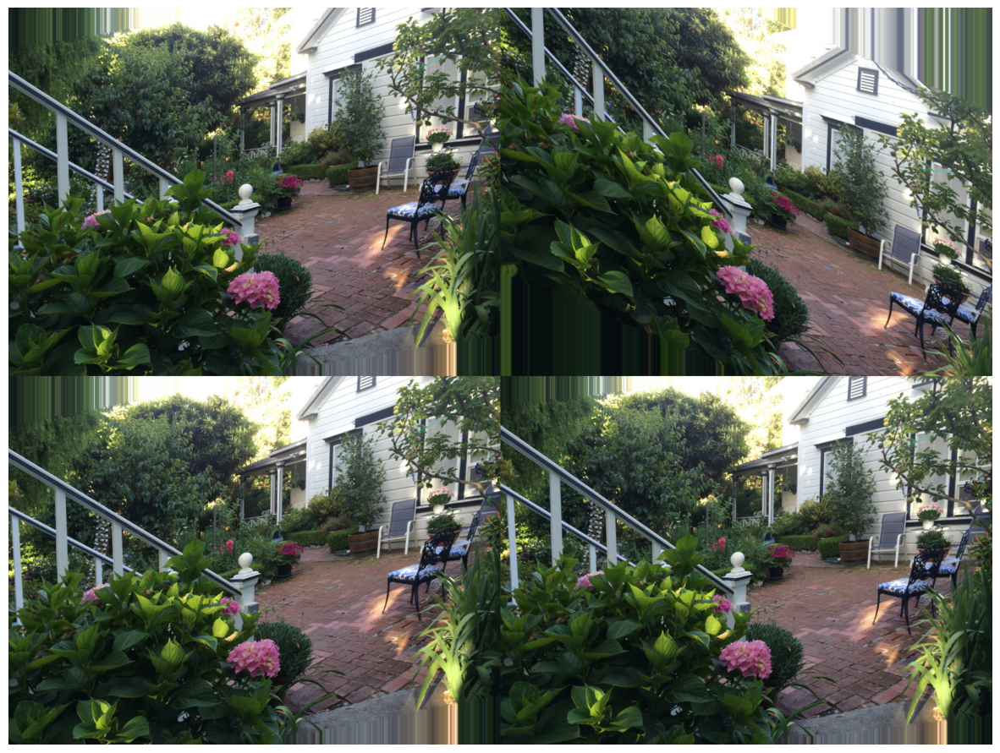

In [27]:
visualize_generator(
  os.path.join(PATH,LOCAL_IMG_FILE),
  ImageDataGenerator(shear_range=30))

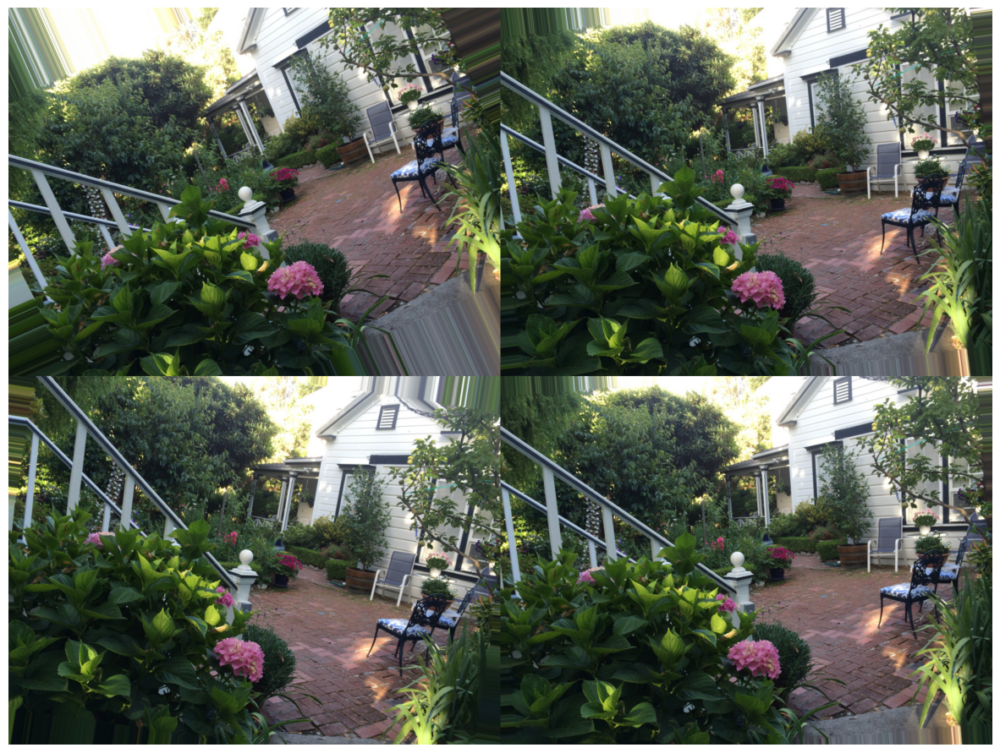

In [28]:
visualize_generator(
  os.path.join(PATH,LOCAL_IMG_FILE),
  ImageDataGenerator(rotation_range=30))